In [57]:
import numpy as np
import matplotlib.pyplot as plt

from alpub_autoencoder.autoencoder_utils import read_alpub_data
from alpub_autoencoder.autoencoder_utils import read_alpub_data_with_segmentation_masks

from PIL import Image

%matplotlib inline

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [58]:
ALPUB_IMG_PATH = '../../Datasets/alpub_v2/images'
ALPUB_MASK_PATH = '../../Datasets/alpub_v2/seg_mask_otsu'

In [59]:
images, labels, masks = read_alpub_data_with_segmentation_masks(img_path=ALPUB_IMG_PATH, seg_path=ALPUB_MASK_PATH)

Processing Image Alpha
Processing Image Beta
Processing Image Chi
Processing Image Delta
Processing Image Epsilon
Processing Image Eta
Processing Image Gamma
Processing Image Iota
Processing Image Kappa
Processing Image Lambda
Processing Image LunateSigma
Processing Image Mu
Processing Image Nu
Processing Image Omega
Processing Image Omicron
Processing Image Phi
Processing Image Pi
Processing Image Psi
Processing Image Rho
Processing Image Tau
Processing Image Theta
Processing Image Upsilon
Processing Image Xi
Processing Image Zeta
Processing Masks: ../../Datasets/alpub_v2/seg_mask_otsu\img_mask_1.jpg
Processing Masks: ../../Datasets/alpub_v2/seg_mask_otsu\img_mask_2.jpg
Processing Masks: ../../Datasets/alpub_v2/seg_mask_otsu\img_mask_3.jpg
Processing Masks: ../../Datasets/alpub_v2/seg_mask_otsu\img_mask_4.jpg
Processing Masks: ../../Datasets/alpub_v2/seg_mask_otsu\img_mask_5.jpg
Processing Masks: ../../Datasets/alpub_v2/seg_mask_otsu\img_mask_6.jpg
Processing Masks: ../../Datasets/alp

In [60]:
images.shape, labels.shape, masks.shape

((205797, 70, 70, 3), (205797, 24), (205797, 70, 70))

In [61]:
# Convert the RGB images to grayscale
img_gray = []
for img in images:
    image_gray = Image.fromarray(img).convert("L")
    img_gray.append(np.array(image_gray))

In [68]:
# Load the greyscaled image

image_no = 400
image = img_gray[image_no]
mask = masks[image_no]

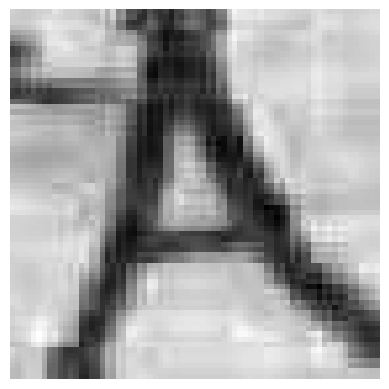

In [69]:
# Display the grayscale image
plt.imshow(image, cmap="gray")
plt.axis("off")
plt.show()

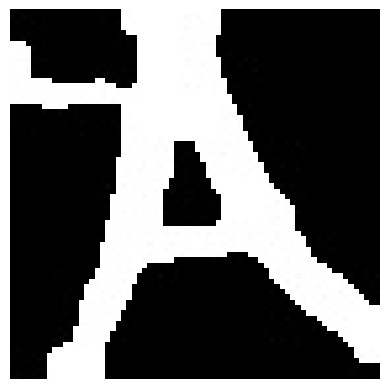

In [70]:
# Display the segmentation mask
plt.imshow(mask, cmap="gray")
plt.axis("off")
plt.show()

In [84]:
# Test-train split
from sklearn.model_selection import train_test_split

# Split the data into training and testing sets while preserving label balance
X_train, X_test, Y_train, Y_test = train_test_split(img_gray, masks, test_size=0.1)
X_train, X_val, Y_train, Y_val = train_test_split(X_train, Y_train, test_size=0.1)

In [82]:
X_train = np.array(X_train)
Y_train = np.array(Y_train)
X_test = np.array(X_test)
Y_test = np.array(Y_test)
X_val = np.array(X_val)
Y_val = np.array(Y_val)

print("Train images shape:",X_train.shape)
print("Train labels shape:",Y_train.shape)
print("Test images shape:",X_test.shape)
print("Test labels shape:",Y_test.shape)
print("Validation images shape:",X_val.shape)
print("Validation labels shape:",Y_val.shape)

Train images shape: (166695, 70, 70)
Train labels shape: (166695, 70, 70)
Test images shape: (20580, 70, 70)
Test labels shape: (20580, 70, 70)
Validation images shape: (18522, 70, 70)
Validation labels shape: (18522, 70, 70)


In [83]:
#UNet Implementation

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as func

from torch.utils.data import DataLoader, Dataset

In [85]:
# Define the device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [86]:
class CharacterDataset(Dataset):
    def __init__(self, images, labels):
        self.images = torch.FloatTensor(images)
        self.labels = torch.FloatTensor(labels)

        self.images = self.images.to(device)
        self.labels = self.labels.to(device)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]
        label = self.labels[idx]
        return image, label

In [87]:
train_dataset = CharacterDataset(X_train, Y_train)
test_dataset = CharacterDataset(X_test, Y_test)
val_dataset = CharacterDataset(X_val, Y_val)

C:\Users\wishm\anaconda3\envs\msc-env\lib\site-packages\ipykernel_launcher.py:3: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at C:\cb\pytorch_1000000000000\work\torch\csrc\utils\tensor_new.cpp:233.)
  This is separate from the ipykernel package so we can avoid doing imports until


In [89]:
#Simple UNet Model without skip connections

class UNetWithoutSkipConnections(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(UNetWithoutSkipConnections, self).__init__()

        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(in_channels, 16, kernel_size=3, stride=1), # 68x68x16
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2), # 34x34x16

            nn.Conv2d(16, 32, kernel_size=3, stride=1), # 32x32x32
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2), # 16x16x32

            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1), # 16x16x64
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2), # 8x8x64

            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1), # 8x8x128
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2) # 4x4x128
        )

        # Decoder
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2),
            nn.ReLU(),
            nn.ConvTranspose2d(32, 16, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(16, out_channels, kernel_size=2, stride=2, padding=1),
            nn.ReLU()
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x